In [1]:
import pandas as pd
import string
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import re
import csv
import numpy as np

In [2]:
with open('FMSL.csv', newline='') as File:  
    reader = csv.reader(File)
    for row in reader:
        print(row)

['id', 'season', 'division', 'round', 'localTeam', 'visitorTeam', 'localGoals', 'visitorGoals', 'date', 'timestamp']
['1', '1970-71', '1', '1', 'Atletico de Bilbao', 'Barcelona', '1', '1', '12/09/1970', '21938400']
['2', '1970-71', '1', '1', 'Las Palmas', 'Atletico de Madrid', '1', '1', '12/09/1970', '21938400']
['3', '1970-71', '1', '1', 'Real Madrid', 'Valencia', '2', '0', '12/09/1970', '21938400']
['4', '1970-71', '1', '1', 'Celta de Vigo', 'Sporting de Gijon', '2', '0', '13/09/1970', '22024800']
['5', '1970-71', '1', '1', 'Elche', 'Granada', '1', '1', '13/09/1970', '22024800']
['6', '1970-71', '1', '1', 'Espanol', 'Sevilla', '0', '1', '13/09/1970', '22024800']
['7', '1970-71', '1', '1', 'Sabadell', 'Real Sociedad', '0', '0', '13/09/1970', '22024800']
['8', '1970-71', '1', '1', 'Zaragoza', 'CD Malaga', '0', '0', '13/09/1970', '22024800']
['9', '1970-71', '1', '2', 'Valencia', 'Las Palmas', '5', '1', '19/09/1970', '22543200']
['10', '1970-71', '1', '2', 'Atletico de Madrid', 'Atletic

['2477', '1973-74', '2', '18', 'Linares CF', 'Tenerife', '0', '1', '06/01/1974', '126658800']
['2478', '1973-74', '2', '18', 'Sabadell', 'Rayo Vallecano', '1', '0', '06/01/1974', '126658800']
['2479', '1973-74', '2', '19', 'Betis', 'Salamanca', '0', '0', '13/01/1974', '127263600']
['2480', '1973-74', '2', '19', 'Tenerife', 'Sevilla', '1', '0', '13/01/1974', '127263600']
['2481', '1973-74', '2', '19', 'Barakaldo', 'Sabadell', '2', '0', '13/01/1974', '127263600']
['2482', '1973-74', '2', '19', 'Valladolid', 'Levante', '3', '1', '13/01/1974', '127263600']
['2483', '1973-74', '2', '19', 'Linares CF', 'Gimnastic de Tarragona', '0', '3', '13/01/1974', '127263600']
['2484', '1973-74', '2', '19', 'Rayo Vallecano', 'Deportivo', '2', '0', '13/01/1974', '127263600']
['2485', '1973-74', '2', '19', 'Osasuna', 'Cadiz', '0', '0', '13/01/1974', '127263600']
['2486', '1973-74', '2', '19', 'Mallorca', 'Ourense', '2', '0', '13/01/1974', '127263600']
['2487', '1973-74', '2', '19', 'Cordoba', 'Hercules', '

['4976', '1977-78', '1', '27', 'Las Palmas', 'Cadiz', '2', '1', '26/03/1978', '259714800']
['4977', '1977-78', '1', '27', 'Real Madrid', 'Real Sociedad', '5', '0', '26/03/1978', '259714800']
['4978', '1977-78', '1', '27', 'Salamanca', 'Atletico de Madrid', '0', '1', '26/03/1978', '259714800']
['4979', '1977-78', '1', '27', 'Sevilla', 'Barcelona', '2', '1', '26/03/1978', '259714800']
['4980', '1977-78', '1', '28', 'Barcelona', 'Espanol', '1', '1', '01/04/1978', '260229600']
['4981', '1977-78', '1', '28', 'Santander', 'Las Palmas', '1', '0', '01/04/1978', '260229600']
['4982', '1977-78', '1', '28', 'Valencia', 'Sporting de Gijon', '1', '0', '01/04/1978', '260229600']
['4983', '1977-78', '1', '28', 'Atletico de Madrid', 'Sevilla', '1', '0', '02/04/1978', '260316000']
['4984', '1977-78', '1', '28', 'Betis', 'Real Madrid', '4', '2', '02/04/1978', '260316000']
['4985', '1977-78', '1', '28', 'Cadiz', 'Salamanca', '0', '1', '02/04/1978', '260316000']
['4986', '1977-78', '1', '28', 'Hercules', 

['7476', '1980-81', '2', '38', 'Linares CF', 'Castellon', '2', '1', '24/05/1981', '359503200']
['7477', '1980-81', '2', '38', 'Castilla', 'Granada', '1', '0', '24/05/1981', '359503200']
['7478', '1980-81', '2', '38', 'Getafe Deportivo', 'Barakaldo', '1', '1', '24/05/1981', '359503200']
['7479', '1980-81', '2', '38', 'AD Ceuta', 'Alaves', '2', '1', '24/05/1981', '359503200']
['7480', '1981-82', '1', '1', 'Atletico de Madrid', 'Atletico de Bilbao', '2', '0', '19/09/1981', '369698400']
['7481', '1981-82', '1', '1', 'Barcelona', 'Cadiz', '4', '0', '20/09/1981', '369784800']
['7482', '1981-82', '1', '1', 'Castellon', 'Las Palmas', '1', '1', '20/09/1981', '369784800']
['7483', '1981-82', '1', '1', 'Hercules', 'Espanol', '2', '0', '20/09/1981', '369784800']
['7484', '1981-82', '1', '1', 'Santander', 'Betis', '2', '1', '20/09/1981', '369784800']
['7485', '1981-82', '1', '1', 'Real Sociedad', 'Real Madrid', '3', '1', '20/09/1981', '369784800']
['7486', '1981-82', '1', '1', 'Sevilla', 'Osasuna',

['9975', '1984-85', '2', '14', 'Sabadell', 'Tenerife', '3', '0', '02/12/1984', '470790000']
['9976', '1984-85', '2', '14', 'Granada', 'Barcelona Atletic', '2', '0', '02/12/1984', '470790000']
['9977', '1984-85', '2', '14', 'Cadiz', 'Recreativo de Huelva', '0', '0', '02/12/1984', '470790000']
['9978', '1984-85', '2', '14', 'Celta de Vigo', 'Bilbao Athletic', '2', '0', '02/12/1984', '470790000']
['9979', '1984-85', '2', '14', 'Lorca', 'Castellon', '0', '3', '02/12/1984', '470790000']
['9980', '1984-85', '2', '14', 'Atletico Madrileno', 'Oviedo', '1', '1', '02/12/1984', '470790000']
['9981', '1984-85', '2', '14', 'Calvo Sotelo', 'Salamanca', '2', '1', '02/12/1984', '470790000']
['9982', '1984-85', '2', '14', 'Logrones', 'Mallorca', '2', '0', '02/12/1984', '470790000']
['9983', '1984-85', '2', '14', 'Cartagena', 'Deportivo', '2', '0', '02/12/1984', '470790000']
['9984', '1984-85', '2', '15', 'Oviedo', 'Sabadell', '0', '1', '08/12/1984', '471308400']
['9985', '1984-85', '2', '15', 'Tenerife

['11975', '1987-88', '1', '28', 'Betis', 'Celta de Vigo', '3', '1', '13/03/1988', '574210800']
['11976', '1987-88', '1', '28', 'Sporting de Gijon', 'Valencia', '2', '2', '13/03/1988', '574210800']
['11977', '1987-88', '1', '28', 'Las Palmas', 'Cadiz', '1', '0', '13/03/1988', '574210800']
['11978', '1987-88', '1', '28', 'Murcia', 'Mallorca', '0', '0', '13/03/1988', '574210800']
['11979', '1987-88', '1', '28', 'Osasuna', 'Sevilla', '1', '3', '13/03/1988', '574210800']
['11980', '1987-88', '1', '28', 'Real Sociedad', 'Sabadell', '1', '0', '13/03/1988', '574210800']
['11981', '1987-88', '1', '28', 'Valladolid', 'Atletico de Madrid', '0', '0', '13/03/1988', '574210800']
['11982', '1987-88', '1', '29', 'Atletico de Bilbao', 'Sporting de Gijon', '1', '1', '20/03/1988', '574815600']
['11983', '1987-88', '1', '29', 'Atletico de Madrid', 'Real Madrid', '1', '3', '20/03/1988', '574815600']
['11984', '1987-88', '1', '29', 'Cadiz', 'Betis', '4', '1', '20/03/1988', '574815600']
['11985', '1987-88', 

['14474', '1990-91', '2', '12', 'Murcia', 'Lleida', '1', '0', '25/11/1990', '659487600']
['14475', '1990-91', '2', '12', 'Bilbao Athletic', 'Eibar', '1', '1', '25/11/1990', '659487600']
['14476', '1990-91', '2', '12', 'Figueres', 'Orihuela', '1', '1', '25/11/1990', '659487600']
['14477', '1990-91', '2', '12', 'Deportivo', 'Xerez', '2', '0', '25/11/1990', '659487600']
['14478', '1990-91', '2', '12', 'Elche', 'Palamos', '1', '4', '25/11/1990', '659487600']
['14479', '1990-91', '2', '12', 'Rayo Vallecano', 'Salamanca', '2', '0', '25/11/1990', '659487600']
['14480', '1990-91', '2', '12', 'Levante', 'Sestao', '1', '0', '25/11/1990', '659487600']
['14481', '1990-91', '2', '12', 'Aviles', 'CD Malaga', '3', '3', '25/11/1990', '659487600']
['14482', '1990-91', '2', '13', 'Palamos', 'Rayo Vallecano', '1', '1', '02/12/1990', '660092400']
['14483', '1990-91', '2', '13', 'Lleida', 'Elche', '2', '0', '02/12/1990', '660092400']
['14484', '1990-91', '2', '13', 'Orihuela', 'Sabadell', '1', '1', '02/12/

['16974', '1993-94', '2', '34', 'Barcelona Atletic', 'Villarreal', '1', '0', '16/04/1994', '766447200']
['16975', '1993-94', '2', '34', 'Palamos', 'Compostela', '0', '0', '16/04/1994', '766447200']
['16976', '1993-94', '2', '34', 'Badajoz', 'Hercules', '1', '1', '17/04/1994', '766533600']
['16977', '1993-94', '2', '34', 'Castellon', 'Espanol', '0', '5', '17/04/1994', '766533600']
['16978', '1993-94', '2', '34', 'Toledo', 'Atletico Marbella', '1', '1', '17/04/1994', '766533600']
['16979', '1993-94', '2', '34', 'Cadiz', 'Real Burgos', '2', '1', '17/04/1994', '766533600']
['16980', '1993-94', '2', '34', 'Castilla', 'Eibar', '0', '0', '17/04/1994', '766533600']
['16981', '1993-94', '2', '34', 'Murcia', 'Merida', '1', '1', '17/04/1994', '766533600']
['16982', '1993-94', '2', '35', 'Merida', 'Castellon', '0', '2', '23/04/1994', '767052000']
['16983', '1993-94', '2', '35', 'Espanol', 'Cadiz', '4', '0', '23/04/1994', '767052000']
['16984', '1993-94', '2', '35', 'Compostela', 'Barcelona Atletic

['19538', '1997-98', '1', '8', 'Barcelona', 'Santander', '2', '0', '26/10/1997', '877816800']
['19539', '1997-98', '1', '8', 'Betis', 'Compostela', '1', '0', '26/10/1997', '877816800']
['19540', '1997-98', '1', '8', 'Sporting de Gijon', 'Atletico de Bilbao', '1', '2', '26/10/1997', '877816800']
['19541', '1997-98', '1', '8', 'Real Sociedad', 'Merida', '2', '1', '26/10/1997', '877816800']
['19542', '1997-98', '1', '8', 'Salamanca', 'Zaragoza', '1', '2', '26/10/1997', '877816800']
['19543', '1997-98', '1', '8', 'Tenerife', 'Valladolid', '1', '0', '26/10/1997', '877816800']
['19544', '1997-98', '1', '8', 'Valencia', 'Oviedo', '1', '1', '26/10/1997', '877816800']
['19545', '1997-98', '1', '8', 'Mallorca', 'Real Madrid', '0', '0', '27/10/1997', '877906800']
['19546', '1997-98', '1', '9', 'Atletico de Bilbao', 'Tenerife', '3', '0', '01/11/1997', '878338800']
['19547', '1997-98', '1', '9', 'Betis', 'Atletico de Madrid', '2', '3', '01/11/1997', '878338800']
['19548', '1997-98', '1', '9', 'Real

['22473', '2000-01', '2', '10', 'Tenerife', 'Badajoz', '3', '0', '01/11/2000', '973033200']
['22474', '2000-01', '2', '10', 'Extremadura', 'Racing de Ferrol', '1', '0', '01/11/2000', '973033200']
['22475', '2000-01', '2', '10', 'Cordoba', 'Elche', '0', '1', '01/11/2000', '973033200']
['22476', '2000-01', '2', '10', 'Murcia', 'Compostela', '2', '0', '01/11/2000', '973033200']
['22477', '2000-01', '2', '10', 'Eibar', 'Betis', '0', '0', '01/11/2000', '973033200']
['22478', '2000-01', '2', '10', 'Sevilla', 'Recreativo de Huelva', '0', '0', '01/11/2000', '973033200']
['22479', '2000-01', '2', '10', 'Salamanca', 'Jaen', '1', '0', '01/11/2000', '973033200']
['22480', '2000-01', '2', '10', 'Lleida', 'Levante', '3', '3', '01/11/2000', '973033200']
['22481', '2000-01', '2', '10', 'Universidad de Las Palmas', 'Atletico de Madrid', '2', '1', '01/11/2000', '973033200']
['22482', '2000-01', '2', '11', 'Jaen', 'Sevilla', '2', '1', '04/11/2000', '973292400']
['22483', '2000-01', '2', '11', 'Atletico d

['25275', '2003-04', '2', '35', 'Malaga B', 'Rayo Vallecano', '2', '1', '01/05/2004', '1083362400']
['25276', '2003-04', '2', '35', 'Tenerife', 'Numancia', '1', '0', '02/05/2004', '1083448800']
['25277', '2003-04', '2', '35', 'Cadiz', 'Salamanca', '3', '3', '02/05/2004', '1083448800']
['25278', '2003-04', '2', '35', 'Recreativo de Huelva', 'Levante', '0', '0', '02/05/2004', '1083448800']
['25279', '2003-04', '2', '35', 'Sporting de Gijon', 'Leganes', '1', '1', '02/05/2004', '1083448800']
['25280', '2003-04', '2', '35', 'Eibar', 'Ciudad de Murcia', '0', '2', '02/05/2004', '1083448800']
['25281', '2003-04', '2', '35', 'Almeria', 'Elche', '3', '1', '02/05/2004', '1083448800']
['25282', '2003-04', '2', '35', 'Algeciras', 'Xerez', '2', '1', '27/05/2004', '1085608800']
['25283', '2003-04', '2', '36', 'Ciudad de Murcia', 'Tenerife', '2', '3', '08/05/2004', '1083967200']
['25284', '2003-04', '2', '36', 'Levante', 'Cordoba', '2', '2', '08/05/2004', '1083967200']
['25285', '2003-04', '2', '36', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [3]:
myfile = 'FMSL.csv'

#read data from a csv file
df = pd.read_csv(myfile,index_col=None)

#display the 'head' of the data
df.describe()

,id,division,round,localGoals,visitorGoals,timestamp
count,37147.000000,37147.000000,37147.000000,37147.000000,37147.000000,3.714700e+04
mean,18574.000000,1.537809,19.862896,1.515385,0.936953,8.116889e+08
std,10723.559561,0.498575,11.282774,1.262742,1.010263,4.322134e+08
min,1.000000,1.000000,1.000000,0.000000,0.000000,2.133360e+07
25%,9287.500000,1.000000,10.000000,1.000000,0.000000,4.453884e+08
50%,18574.000000,2.000000,20.000000,1.000000,1.000000,8.317656e+08
75%,27860.500000,2.000000,29.000000,2.000000,1.000000,1.181426e+09
max,37147.000000,2.000000,44.000000,10.000000,8.000000,1.527890e+09


In [4]:
#print(df.shape)
#print(df.describe)
print(df.head(10))

   id   season  division  round           localTeam         visitorTeam  \
0   1  1970-71         1      1  Atletico de Bilbao           Barcelona   
1   2  1970-71         1      1          Las Palmas  Atletico de Madrid   
2   3  1970-71         1      1         Real Madrid            Valencia   
3   4  1970-71         1      1       Celta de Vigo   Sporting de Gijon   
4   5  1970-71         1      1               Elche             Granada   
5   6  1970-71         1      1             Espanol             Sevilla   
6   7  1970-71         1      1            Sabadell       Real Sociedad   
7   8  1970-71         1      1            Zaragoza           CD Malaga   
8   9  1970-71         1      2            Valencia          Las Palmas   
9  10  1970-71         1      2  Atletico de Madrid  Atletico de Bilbao   

   localGoals  visitorGoals        date  timestamp  
0           1             1  12/09/1970   21938400  
1           1             1  12/09/1970   21938400  
2           2  

In [5]:
#I create a new column to see which teams won the match
difference_goals = df['localGoals'] - df['visitorGoals']

#Allocate the column in the df
df['differencegoals'] = difference_goals

#Delete de column timestamp
#del df['timestamp']
# df2 = df.drop(['timestamp], axis=1)

#Create the column winner

In [6]:
df

,id,season,division,round,localTeam,visitorTeam,localGoals,visitorGoals,date,timestamp,differencegoals
0,1,1970-71,1,1,Atletico de Bilbao,Barcelona,1,1,12/09/1970,21938400,0
1,2,1970-71,1,1,Las Palmas,Atletico de Madrid,1,1,12/09/1970,21938400,0
2,3,1970-71,1,1,Real Madrid,Valencia,2,0,12/09/1970,21938400,2
3,4,1970-71,1,1,Celta de Vigo,Sporting de Gijon,2,0,13/09/1970,22024800,2
4,5,1970-71,1,1,Elche,Granada,1,1,13/09/1970,22024800,0
...,...,...,...,...,...,...,...,...,...,...,...
37142,37143,2017-18,2,42,Valladolid,Osasuna,2,0,02/06/2018,1527890400,2
37143,37144,2017-18,2,42,Oviedo,Huesca,2,1,02/06/2018,1527890400,1
37144,37145,2017-18,2,42,Alcorcon,Reus,3,0,02/06/2018,1527890400,3
37145,37146,2017-18,2,42,Numancia,Cultural Leonesa,2,1,02/06/2018,1527890400,1


In [7]:
def calculate_winner_team(df):
    if (df['localGoals'] < df['visitorGoals']):
        return df['visitorTeam']
    elif (df['localGoals'] > df['visitorGoals']):
        return df['localTeam']
    elif (df['localGoals'] == df['visitorGoals']):
        return 'Draw'
    
    
df['winner_team'] =df.apply(calculate_winner_team, axis=1)
#Another option would be 
#df = df.assing(Grade=df.apply(calculate_winner_team, axis=1))

In [8]:
#Just valid for 2 options
#df['winner'] = np.where(df['differencegoals'] > 0, 'localTeam', 'visitorTeam')

#Otherway
#df.loc[df['differencegoals'] > 0, 'winner'] = 'localTeam'
#df.loc[df['differencegoals'] <= 0, 'winner'] = 'visitorTeam'


In [9]:
#To check the total number of different elements for every column
df.nunique()

id                 37147
season                48
division               2
round                 44
localTeam            115
visitorTeam          115
localGoals            11
visitorGoals           9
date                4589
timestamp           4589
differencegoals       18
winner_team          116
dtype: int64

In [10]:
df.isnull().sum()

id                 0
season             0
division           0
round              0
localTeam          0
visitorTeam        0
localGoals         0
visitorGoals       0
date               0
timestamp          0
differencegoals    0
winner_team        0
dtype: int64

In [13]:
#Delete timestamp and id
df1 = df.drop(columns=['timestamp', 'id'])
df1

,season,division,round,localTeam,visitorTeam,localGoals,visitorGoals,date,differencegoals,winner_team
0,1970-71,1,1,Atletico de Bilbao,Barcelona,1,1,12/09/1970,0,Draw
1,1970-71,1,1,Las Palmas,Atletico de Madrid,1,1,12/09/1970,0,Draw
2,1970-71,1,1,Real Madrid,Valencia,2,0,12/09/1970,2,Real Madrid
3,1970-71,1,1,Celta de Vigo,Sporting de Gijon,2,0,13/09/1970,2,Celta de Vigo
4,1970-71,1,1,Elche,Granada,1,1,13/09/1970,0,Draw
...,...,...,...,...,...,...,...,...,...,...
37142,2017-18,2,42,Valladolid,Osasuna,2,0,02/06/2018,2,Valladolid
37143,2017-18,2,42,Oviedo,Huesca,2,1,02/06/2018,1,Oviedo
37144,2017-18,2,42,Alcorcon,Reus,3,0,02/06/2018,3,Alcorcon
37145,2017-18,2,42,Numancia,Cultural Leonesa,2,1,02/06/2018,1,Numancia


In [16]:
df1['winner_team'].value_counts()


Draw                         10236
Real Madrid                   1073
Barcelona                     1053
Atletico de Madrid             846
Valencia                       784
                             ...  
Universidad de Las Palmas        8
Alicante                         8
Lorca FC                         8
Moscardo                         6
Mollerussa                       3
Name: winner_team, Length: 116, dtype: int64

In [17]:
#Get the percentage of real madrid wins for all the matches
total_rmadrid_wins = df[df.winner_team == 'Real Madrid']
total_rmadrid_wins = total_rmadrid_wins['winner_team']

print(total_rmadrid_wins)
print('\n')
print('The percentage of real madrid wins is:', round((total_rmadrid_wins.shape[0] / df.shape[0]) * 100, 1))
print('\n')

#Get the percentage of real madrid wins 
total_rmadrid_wins_local = df[df.localTeam == 'Real Madrid']
total_rmadrid_wins_local = total_rmadrid_wins_local['localTeam']

print(total_rmadrid_wins_local)
print('\n')
print('The percentage of real madrid wins as local is:', round((total_rmadrid_wins_local.shape[0] / df.shape[0]) * 100, 1))
print('\n')


2        Real Madrid
17       Real Madrid
45       Real Madrid
79       Real Madrid
85       Real Madrid
            ...     
36594    Real Madrid
36598    Real Madrid
36624    Real Madrid
36647    Real Madrid
36668    Real Madrid
Name: winner_team, Length: 1073, dtype: object


The percentage of real madrid wins is: 2.9


2        Real Madrid
17       Real Madrid
35       Real Madrid
52       Real Madrid
68       Real Madrid
            ...     
36594    Real Madrid
36611    Real Madrid
36630    Real Madrid
36647    Real Madrid
36668    Real Madrid
Name: localTeam, Length: 885, dtype: object


The percentage of real madrid wins as local is: 2.4




In [18]:
#Create the column to see if the team win as local
def team_wins_as_local(df):
    if (df['localGoals'] < df['visitorGoals']):
        return False
    elif (df['localGoals'] > df['visitorGoals']):
        return True
    elif (df['localGoals'] == df['visitorGoals']):
        return 'Draw'
    
    
df['win_as_local'] =df.apply(team_wins_as_local, axis=1)

#Create the column to see if the team win as visitor
def team_wins_as_visitor(df):
    if (df['localGoals'] < df['visitorGoals']):
        return True
    elif (df['localGoals'] > df['visitorGoals']):
        return False
    elif (df['localGoals'] == df['visitorGoals']):
        return 'Draw'
    
    
df['win_as_visitor'] =df.apply(team_wins_as_visitor, axis=1)

2                   Real Madrid
3                 Celta de Vigo
8                      Valencia
9            Atletico de Madrid
10                    Barcelona
                  ...          
37141    Gimnastic de Tarragona
37142                Valladolid
37143                    Oviedo
37144                  Alcorcon
37145                  Numancia
Name: localTeam, Length: 18787, dtype: object


The percentage of total wins as local is: 50.6


5                  Espanol
18                Valencia
23                Zaragoza
27       Sporting de Gijon
33                   Elche
               ...        
37116             Lorca FC
37124                 Lugo
37125                 Reus
37134               Huesca
37146    Barcelona Atletic
Name: localTeam, Length: 8124, dtype: object


The percentage of total loss as local is: 21.9


0        Atletico de Bilbao
1                Las Palmas
4                     Elche
6                  Sabadell
7                  Zaragoza
                ..

Text(0.5, 1.0, 'Percentage of total wins as local team')

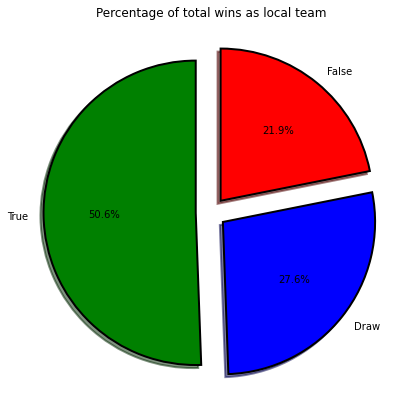

In [19]:
#Get the percentage of total wins as local
total_wins_local = df[df.win_as_local == True]
total_wins_local = total_wins_local['localTeam']

print(total_wins_local)
print('\n')
print('The percentage of total wins as local is:', round((total_wins_local.shape[0] / df.shape[0]) * 100, 1))
print('\n')

#Get the percentage of total losses as local
total_losses_local = df[df.win_as_local == False]
total_losses_local = total_losses_local['localTeam']

print(total_losses_local)
print('\n')
print('The percentage of total loss as local is:', round((total_losses_local.shape[0] / df.shape[0]) * 100, 1))
print('\n')


#Get the percentage of total draw as local
total_draws_local = df[df.win_as_local == 'Draw']
total_draws_local = total_draws_local['localTeam']

print(total_draws_local)
print('\n')
print('The percentage of total draw as local is:', round((total_draws_local.shape[0] / df.shape[0]) * 100, 1))
print('\n')


fig = plt.figure(figsize=(7,7))
colors = ('green', 'blue', 'red')
wp = {'linewidth':2, 'edgecolor':'black'}
tags = df['win_as_local'].value_counts()
explode= (0.1,0.1,0.1)
tags.plot(kind='pie', autopct='%1.1f%%', shadow=True, colors = colors,
        startangle=90, wedgeprops = wp, explode = explode, label='')
plt.title('Percentage of total wins as local team')

In [22]:
#Check the local team when Real Madrid is winning
df1 = df['localTeam'].where(df['winner_team'] == 'Real Madrid')

#Check the visitor team when Real Madrid is winning
df2 = df['visitorTeam'].where(df['winner_team'] == 'Real Madrid')

#Check when Real Madrid win as local 
df3 = df['win_as_local'].where(df['winner_team'] == 'Real Madrid')

#Check when Real Madrid win as visitor
df4 = df['win_as_visitor'].where(df['winner_team'] == 'Real Madrid')

df1

0                NaN
1                NaN
2        Real Madrid
3                NaN
4                NaN
            ...     
37142            NaN
37143            NaN
37144            NaN
37145            NaN
37146            NaN
Name: localTeam, Length: 37147, dtype: object

In [23]:
#Check the Real Madrid victories playing as local
local_rm = df['winner_team'] == 'Real Madrid'
local_rm2 = df['localTeam'] == 'Real Madrid'
df.where(local_rm&local_rm2)

,id,season,division,round,localTeam,visitorTeam,localGoals,visitorGoals,date,timestamp,differencegoals,winner_team,win_as_local,win_as_visitor
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,1970-71,1.0,1.0,Real Madrid,Valencia,2.0,0.0,12/09/1970,21938400.0,2.0,Real Madrid,True,False
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


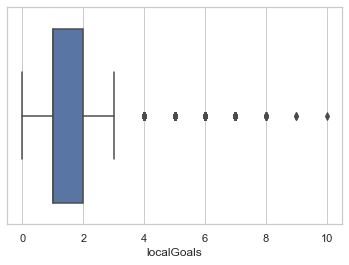

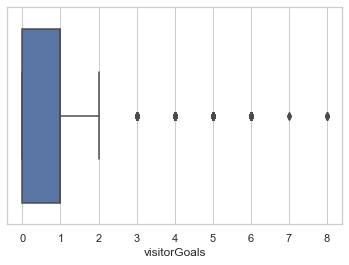

In [24]:
#Boxplot for localGoals and visitorGoals
sns.set(style='whitegrid')
ax = sns.boxplot(x=df['localGoals'])
plt.show(ax)

sns.set(style='whitegrid')
ax2 = sns.boxplot(x=df['visitorGoals'])
plt.show(ax)

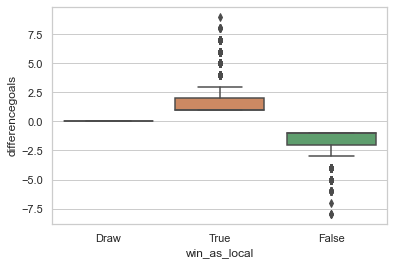

In [25]:
ay = sns.boxplot(x='win_as_local', y = 'differencegoals', data = df)
plt.show(ay)

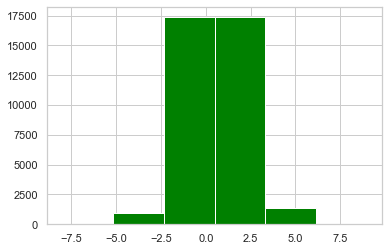

In [26]:
x_diffenrencegoals = df.differencegoals
n_bins = 6
N, bins, patches = plt.hist(x_diffenrencegoals, bins = n_bins, facecolor = 'green')
plt.show()

In [27]:
import plotly.graph_objects as go

In [28]:
fig = go.Figure(data=[go.Bar(
    x=df['win_as_local'][0:20], y=df['differencegoals'][0:20],
    text=df['differencegoals'][0:20],
    textposition='auto',
    marker_color='Blue',
)])
fig.show()

In [29]:
fig = go.Figure(go.Bar(
    x=df['differencegoals'],
    y=df['winner_team'],
    orientation='h',
    marker_color ='green',))

fig.update_layout(
    title='Difference Goals based on the Winner Team',
    template='plotly_white',
    xaxis_title='differencegoals',
    yaxis_title='winner_team',
)
fig.show()

In [30]:
fig = go.Figure(go.Bar(
    x=df['winner_team'],
    y=df['differencegoals'],
    orientation='h',
    marker_color ='green',))

fig.update_layout(
    title='Winner Team based on the Difference Goals',
    template='none',
    xaxis_title='winner_team',
    yaxis_title='differencegoals',
)
fig.show()

In [31]:
import plotly.express as px

In [32]:
fig = px.pie(df, values=df['differencegoals'], names =df['winner_team'], title='Difference goals based on Winner team', hole=.5)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [36]:
#I create a new data frame called df6 what includes these 2 columns.
df_lt_lg = df.loc[: ,['localTeam','localGoals']]
df_lt_lg

#Sort it by localGoals.

df_lt_lg2 = df_lt_lg.sort_values(by = 'localGoals', ascending = False)
df_lt_lg2


,localTeam,localGoals
34775,Real Madrid,10
5558,Barcelona,9
34064,Real Madrid,9
30781,Real Madrid,8
10111,Oviedo,8
...,...,...
13316,Logrones,0
28053,Valladolid,0
13315,Sporting de Gijon,0
28056,Mallorca,0


In [38]:
#We get the mean for the localGoals of every team pleaying as local.
df_lt_lg2.groupby('localTeam')['localGoals'].mean().sort_values(ascending = False)

localTeam
Real Madrid                  2.525424
Barcelona                    2.520904
Atletico de Madrid           1.877390
Valencia                     1.825989
Atletico de Bilbao           1.716384
                               ...   
Lorca                        0.894737
Universidad de Las Palmas    0.857143
Moscardo                     0.631579
Burgos CF                    0.571429
Mollerussa                   0.421053
Name: localGoals, Length: 115, dtype: float64

In [39]:
#I create a new data frame called df6 what includes these 2 columns.
df_vt_vg = df.loc[: ,['visitorTeam','visitorGoals']]
df_vt_vg

#Sort it by visitorGoals.

df_vt_vg2 = df_vt_vg.sort_values(by = 'visitorGoals', ascending = False)
df_vt_vg2

,visitorTeam,visitorGoals
34953,Barcelona,8
17392,Deportivo,8
30522,Barcelona,8
34120,Barcelona,8
18229,Valladolid,8
...,...,...
26561,Espanol,0
19290,Osasuna,0
19289,Las Palmas,0
19287,Barcelona Atletic,0


In [42]:
#We get the mean for the visitorGoals of every team pleaying as visitor.
mean_vg_vg2 = df_vt_vg2.groupby('visitorTeam')['visitorGoals'].mean().sort_values(ascending = False)
mean_vg_vg2

visitorTeam
Barcelona             1.627119
Real Madrid           1.624859
Atletico de Madrid    1.212598
Valencia              1.127684
Girona                1.110577
                        ...   
Aviles                0.368421
Ontinyent             0.368421
Alzira                0.368421
Lorca                 0.315789
AD Ceuta              0.263158
Name: visitorGoals, Length: 115, dtype: float64

,visitorTeam,visitorGoals
0,Barcelona,1
1,Atletico de Madrid,1
2,Valencia,0
3,Sporting de Gijon,0
4,Granada,1
...,...,...
37142,Osasuna,0
37143,Huesca,1
37144,Reus,0
37145,Cultural Leonesa,1


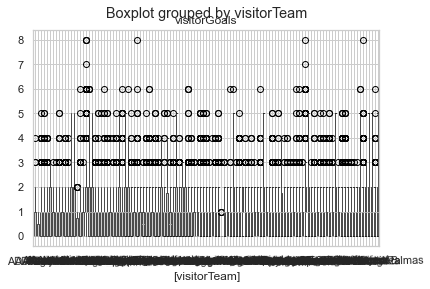

In [51]:
df_vt_vg = df.loc[: ,['visitorTeam','visitorGoals']]
counts=df_vt_vg.groupby('visitorTeam').visitorGoals.count().reset_index('visitorTeam')
y = counts[counts.visitorGoals > 5]['visitorTeam']
y
z= df_vt_vg[df_vt_vg.visitorTeam.isin(y)]
z.boxplot(by='visitorTeam', rot = 1)
z

In [56]:
#Count the total number of goals scored by a local Team.
counts_local_goals = df_lt_lg['localGoals'].value_counts()
counts_local_goals

1     12495
2      9122
0      8314
3      4503
4      1853
5       617
6       172
7        57
8        11
9         2
10        1
Name: localGoals, dtype: int64

<AxesSubplot:>

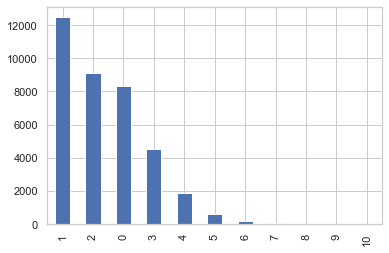

In [57]:
counts_local_goals.plot(kind='bar')

In [58]:
#Count the total number of goals scored by a visitor Team.
counts_visitor_goals = df_vt_vg['visitorGoals'].value_counts()
counts_visitor_goals

0    14958
1    13403
2     6016
3     1981
4      580
5      161
6       40
8        6
7        2
Name: visitorGoals, dtype: int64

<AxesSubplot:>

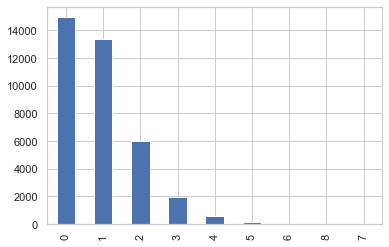

In [59]:
counts_visitor_goals.plot(kind='bar')

In [62]:
#Count the total number of victories by every team.
counts_winner_team = df['winner_team'].value_counts()
counts_winner_team

Draw                         10236
Real Madrid                   1073
Barcelona                     1053
Atletico de Madrid             846
Valencia                       784
                             ...  
Universidad de Las Palmas        8
Alicante                         8
Lorca FC                         8
Moscardo                         6
Mollerussa                       3
Name: winner_team, Length: 116, dtype: int64